In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay

import os
from os import walk

In [2]:
classes = {"buildings":0,"forest":1,"glacier":2, "mountain":3, "sea":4, "street":5}
dir_pred = "D:/Downloads/CNN/seg_pred/seg_pred"
dir_test = "D:/Downloads/CNN//seg_test/seg_test"
dir_train =  "D:/Downloads/CNN//seg_train/seg_train"

In [4]:
# read in the names of the images in the prediction set
(dirpath_pred, dirnames_pred, fnames_pred) = next(walk(dir_pred))
print("Size of the prediction set is {}".format(len(fnames_pred)))

Size of the prediction set is 7301


In [5]:
def read_image_names_class(dpath):
    fnames = {}
    x, dirnames, y = next(walk(dpath))
    for d in dirnames:
        _,_,temp = next(walk(os.path.join(dpath,d)))
        fnames[classes[d]] = temp        
    
    return dirnames, fnames

def check_class_imbalance(fnames):
    count = 0
    class_summary = {}
    for key,value in fnames.items():
        count = count + len(value)
        class_summary[key] = len(value)
        
    summary = pd.DataFrame.from_dict(class_summary, orient='index', columns=["Count"])  
    summary['CumCount'] = np.cumsum(summary['Count']) 
    summary['Class'] = summary.index
    summary['Class'] = summary['Class'].apply(class_from_key)
    
    return summary

def class_from_key(x):
    for key, value in classes.items():
        if x == value:
            return key
        
def sample_images_from_class(nsample, classname, path, fnames):
    sind = np.random.random_integers(1,len(fnames[classes[classname]]),nsample)
    spath = [os.path.join(path, classname, fnames[classes[classname]][i]) for i in sind]
    
    return spath

def plot_sampled_images(path, fnames):
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    
    for i,cl in enumerate(classes.keys()):
        sp = sample_images_from_class(nsample, cl, path, fnames)
        for j,spj in enumerate(sp):            
            img = mpimg.imread(spj)
            ax[j,i].imshow(img)
            ax[j,i].axis('off')
            ax[j,i].set_title(cl)   
            
def plot_sampled_prediction_images(path, fnames):    
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    sind = np.random.random_integers(1,len(fnames), nsample*ncols)
    
    axs = ax.ravel()
    for i, sp in enumerate(sind):
        spj = os.path.join(path, fnames[sp])
        img = mpimg.imread(spj)
        axs[i].imshow(img)
        axs[i].axis('off')
    
def get_true_pred(model, ds):
    y = model.predict(ds)

    ytrue = []
    ypred = []

    ypred.append(np.argmax(y,axis=1))
    for img, lbl in ds:
        for l in lbl:
            ytrue.append(np.argmax(l.numpy()))    
    
    return ytrue, ypred

def plot_confMat(ytrue, ypred):
    cm = confusion_matrix(y_true = ytrue,y_pred = ypred[0])
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_from_key(x) for x in range(6)])
    cmd.plot(include_values=True, cmap = plt.cm.Blues, ax=None)

    plt.title("Accuracy score is {:.2f}".format(accuracy_score(y_true = ytrue,y_pred = ypred[0])))

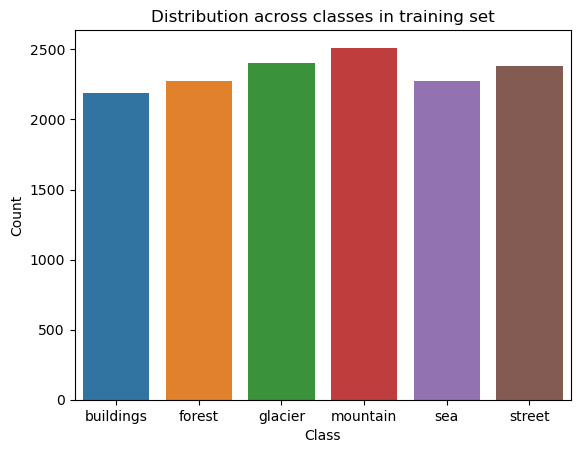

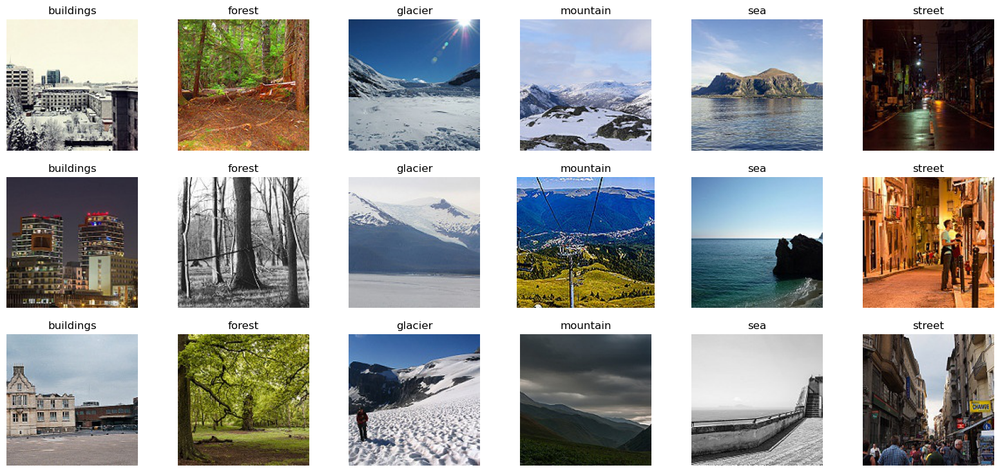

In [6]:
dirnames_train, fnames_train = read_image_names_class(dir_train)
train_summary = check_class_imbalance(fnames_train)
train_summary.head(10)
sns.barplot(data=train_summary, x = 'Class', y='Count').set_title("Distribution across classes in training set")
plot_sampled_images(dir_train, fnames_train)

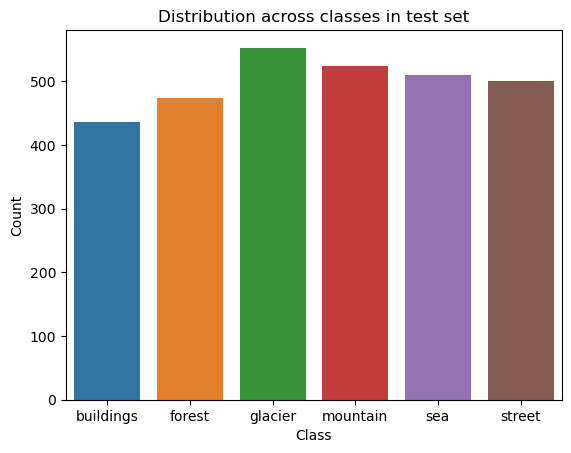

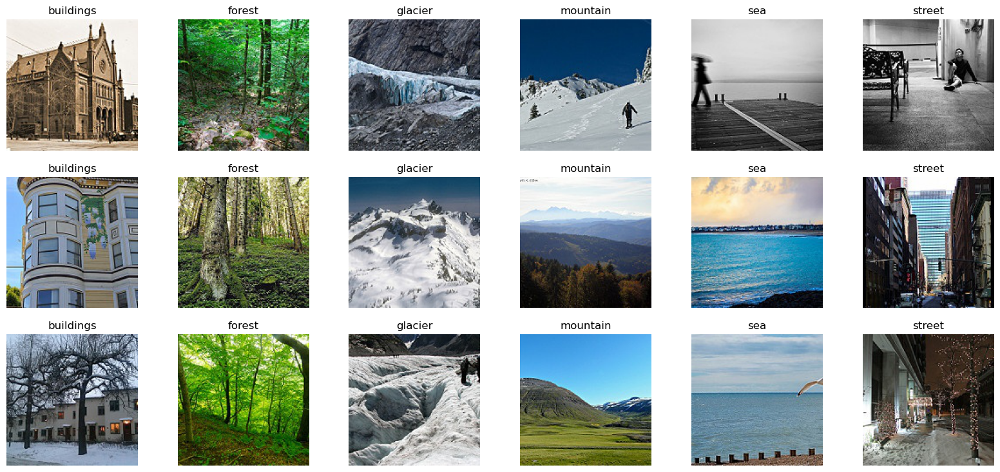

In [7]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

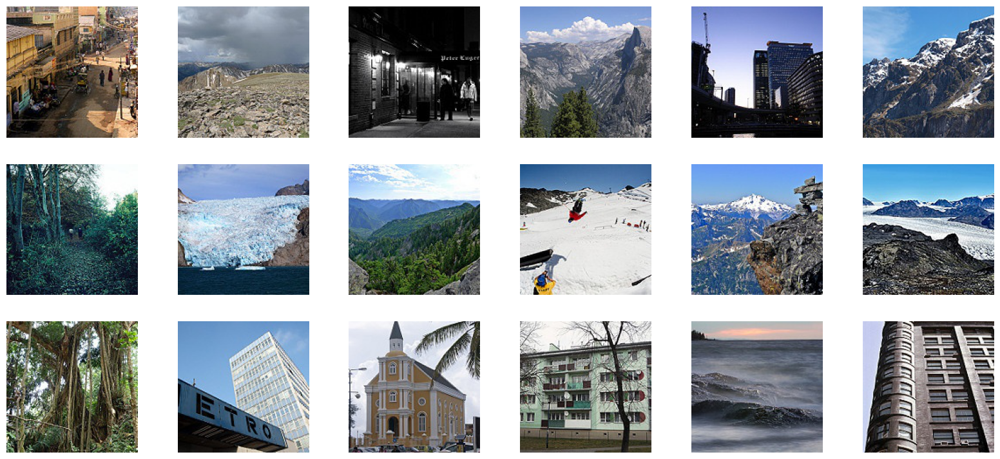

In [8]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

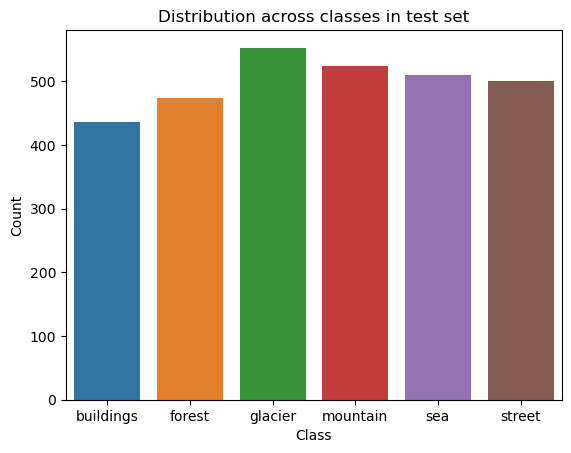

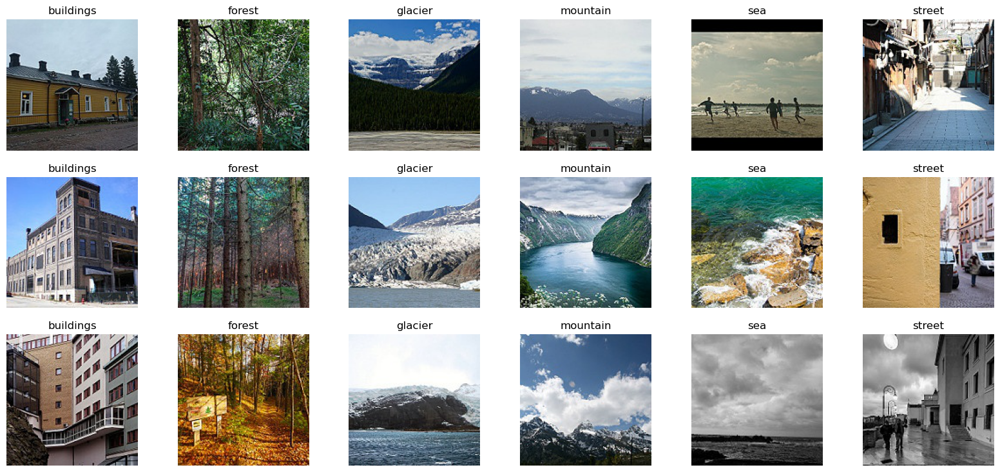

In [9]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

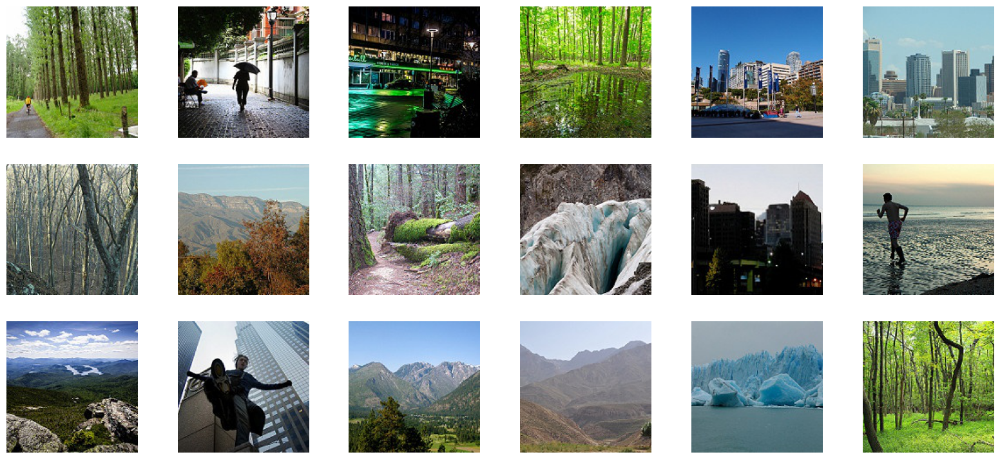

In [10]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

In [11]:
import tensorflow as tf
tf.random.set_seed(0)

In [12]:
batch = 32
shuff = True
train_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="training",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')
val_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="validation",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')


Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.


In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [14]:
import tensorflow as tf

mod = tf.keras.models.Sequential([    
    tf.keras.layers.Rescaling(scale=1./255, input_shape=(150, 150, 3)),
    tf.keras.layers.RandomContrast(factor=0.2),
    tf.keras.layers.RandomFlip(mode="horizontal"),
    tf.keras.layers.RandomRotation(factor=0.05),
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2),
    tf.keras.layers.RandomZoom(height_factor=(0.1, 0.3), width_factor=(0.1, 0.3)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(1,1), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),   
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(5,5), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),      
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(5,5), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),      
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=6, activation='softmax')
])


In [15]:
mets = ['accuracy', tf.metrics.Precision(), tf.metrics.Recall(), 
        tf.metrics.TrueNegatives(), tf.metrics.TruePositives(), tf.metrics.FalseNegatives(), tf.metrics.FalsePositives()]
mod.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), 
            loss=tf.keras.losses.CategoricalCrossentropy(), metrics= mets)

In [16]:
earlystop = tf.keras.callbacks.EarlyStopping(patience=10, min_delta=1e-3, restore_best_weights=True)
lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-7)

# traindat_aug = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=10, width_shift_range=0.2, height_shift_range=0.2, 
#                                                           brightness_range=(-2.,2.), zoom_range=0.2, horizontal_flip=True, 
#                                                           rescale=1./255, validation_split=0.2)
# testdat_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


# train_ds = traindat_aug.flow_from_directory(dir_train, target_size=(150,150), batch_size=batch, class_mode='categorical', subset="training")
# valid_ds = traindat_aug.flow_from_directory(dir_train, target_size=(150,150), batch_size=batch, class_mode='categorical', subset="validation")
# test_ds = testdat_aug.flow_from_directory(dir_test, target_size=(150,150), batch_size=batch, class_mode='categorical')

# traindat_aug.fit(train_ds)


In [17]:
hist = mod.fit(train_ds, epochs=3, batch_size=batch, verbose=1, shuffle=shuff, validation_data=val_ds, callbacks=[earlystop, lr])

Epoch 1/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 846s 2s/step - accuracy: 0.3943 - false_negatives: 4679.4941 - false_positives: 619.1733 - loss: 1.4833 - precision: 0.5824 - recall: 0.1512 - true_negatives: 27613.5547 - true_positives: 967.0511 - val_accuracy: 0.4647 - val_false_negatives: 2087.0000 - val_false_positives: 520.0000 - val_loss: 1.2907 - val_precision: 0.5803 - val_recall: 0.2562 - val_true_negatives: 13510.0000 - val_true_positives: 719.0000 - learning_rate: 0.0100
Epoch 2/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 679s 2s/step - accuracy: 0.5455 - false_negatives: 3725.2529 - false_positives: 867.7812 - loss: 1.1294 - precision: 0.6901 - recall: 0.3343 - true_negatives: 27353.6387 - true_positives: 1919.0312 - val_accuracy: 0.4665 - val_false_negatives: 2119.0000 - val_false_positives: 435.0000 - val_loss: 1.3407 - val_precision: 0.6123 - val_recall: 0.2448 - val_true_negatives: 13595.0000 - val_true_positives: 687.0000 - learning_rate: 0.0100
Epoch 3/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 690s 2s/

In [18]:
mod.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_contrast                 │ (None, 150, 150, 3)       │          0 │
│ (RandomContrast)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_flip (RandomFlip)        │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_rotation                 │ (None, 150, 150, 3)       │          0 │
│ (RandomRotation)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_translation              │ (None, 150, 150, 3)       │          0 │
│ (RandomTranslation)             │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_zoom (RandomZoom)        │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d (Conv2D)                 │ (None, 150, 150, 16)      │        448 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization             │ (None, 150, 150, 16)      │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout (Dropout)               │ (None, 150, 150, 16)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 12)      │      1,740 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_1           │ (None, 150, 150, 12)      │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_1 (Dropout)             │ (None, 150, 150, 12)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 12)        │        156 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_2           │ (None, 75, 75, 12)        │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_2 (Dropout)             │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_3 (Conv2D)               │ (None, 37, 37, 16)        │      1,744 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_3           │ (None, 37, 37, 16)        │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_3 (Dropout)             │ (None, 37, 37, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼──────────

 Total params: 230,748 (901.36 KB)

 Trainable params: 76,814 (300.05 KB)

 Non-trainable params: 304 (1.19 KB)

 Optimizer params: 153,630 (600.12 KB)

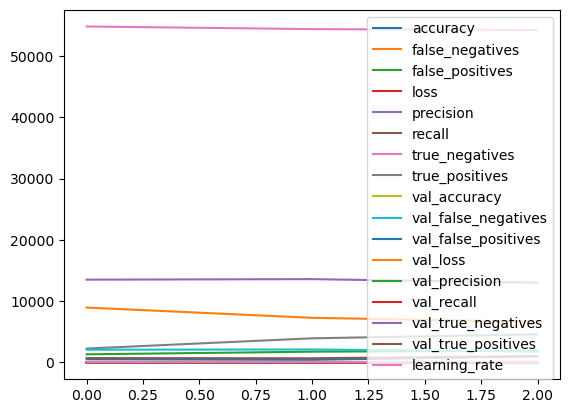

In [19]:
for key in hist.history.keys():
    plt.plot(hist.history[key],label=key)
plt.legend()
# plt.ylim([0,1])

In [20]:
mod.evaluate(train_ds)

351/351 ━━━━━━━━━━━━━━━━━━━━ 87s 247ms/step - accuracy: 0.4867 - false_negatives: 4103.7896 - false_positives: 930.7074 - loss: 1.2571 - precision: 0.6223 - recall: 0.2706 - true_negatives: 27295.8262 - true_positives: 1541.5171


[1.2559298276901245,
 0.48583897948265076,
 8119.0,
 1857.0,
 0.6260572075843811,
 0.27689704298973083,
 54283.0,
 3109.0]

In [21]:
mod.evaluate(val_ds)

88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - accuracy: 0.4540 - false_negatives: 1075.0337 - false_positives: 263.6966 - loss: 1.2980 - precision: 0.5713 - recall: 0.2471 - true_negatives: 6933.3818 - true_positives: 364.3820


[1.2906590700149536,
 0.46471846103668213,
 2087.0,
 520.0,
 0.5803067088127136,
 0.25623664259910583,
 13510.0,
 719.0]

Found 3000 files belonging to 6 classes.
94/94 ━━━━━━━━━━━━━━━━━━━━ 62s 607ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - accuracy: 0.4831 - false_negatives: 1149.0421 - false_positives: 303.7895 - loss: 1.3835 - precision: 0.5005 - recall: 0.2355 - true_negatives: 7373.6841 - true_positives: 386.4526


[1.2618508338928223,
 0.4763333201408386,
 2210.0,
 515.0,
 0.6053639650344849,
 0.2633333206176758,
 14485.0,
 790.0]

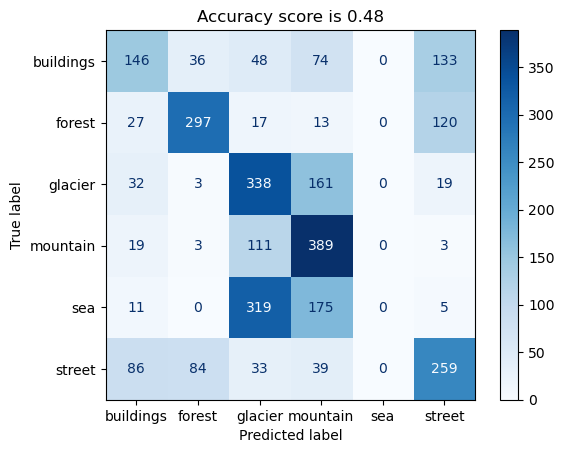

In [22]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_test, seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= False, label_mode='categorical')
# y_test = mod.predict(test_ds)
# tf.keras.utils.to_categorical(np.argmax(y_test,axis=1))
y_true, y_pred = get_true_pred(mod, test_ds)
plot_confMat(y_true, y_pred)

mod.evaluate(test_ds)

In [27]:
import tensorflow as tf

def load_data(train_directory, test_directory, pred_directory, image_size, batch_size):
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255,
    )

    # Get the class labels from your dictionary
    classes = {"buildings": 0, "forest": 1, "glacier": 2, "mountain": 3, "sea": 4, "street": 5}

    train_ds = datagen.flow_from_directory(
        train_directory,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        classes=list(classes.keys()),  # Use the class names as labels
    )

    test_ds = datagen.flow_from_directory(
        test_directory,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        classes=list(classes.keys()),  # Use the class names as labels
    )

    pred_ds = datagen.flow_from_directory(
        pred_directory,
        target_size=image_size,
        batch_size=batch_size,
        class_mode=None,  # No class labels for prediction data
        shuffle=False,    # No need to shuffle for prediction
    )

    return train_ds, test_ds, pred_ds

# Example usage
dir_train = 'D:/Downloads/CNN/seg_pred/seg_train'
dir_test = 'D:/Downloads/CNN/seg_pred/seg_test'
dir_pred = 'D:/Downloads/CNN/seg_pred/seg_pred'
image_size = (150, 150)
batch_size = 32

train_ds, test_ds, pred_ds = load_data(dir_train, dir_test, dir_pred, image_size, batch_size)


Found 0 images belonging to 6 classes.
Found 0 images belonging to 6 classes.
Found 0 images belonging to 0 classes.


In [31]:
mod.save("D:/Downloads/CNN/your_model1.keras") 

In [32]:
loaded_model = tf.keras.models.load_model("D:/Downloads/CNN/your_model1.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


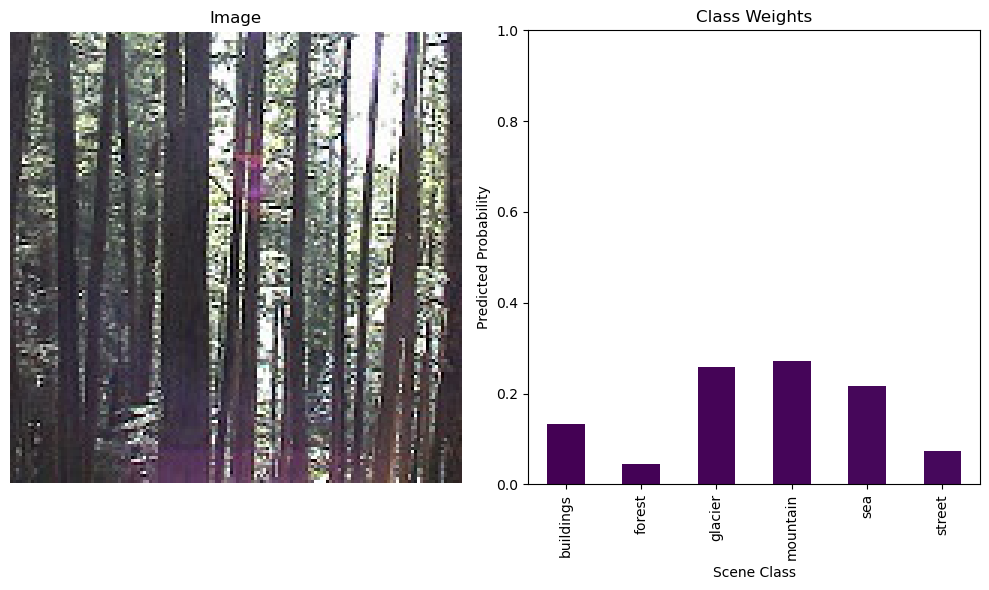

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


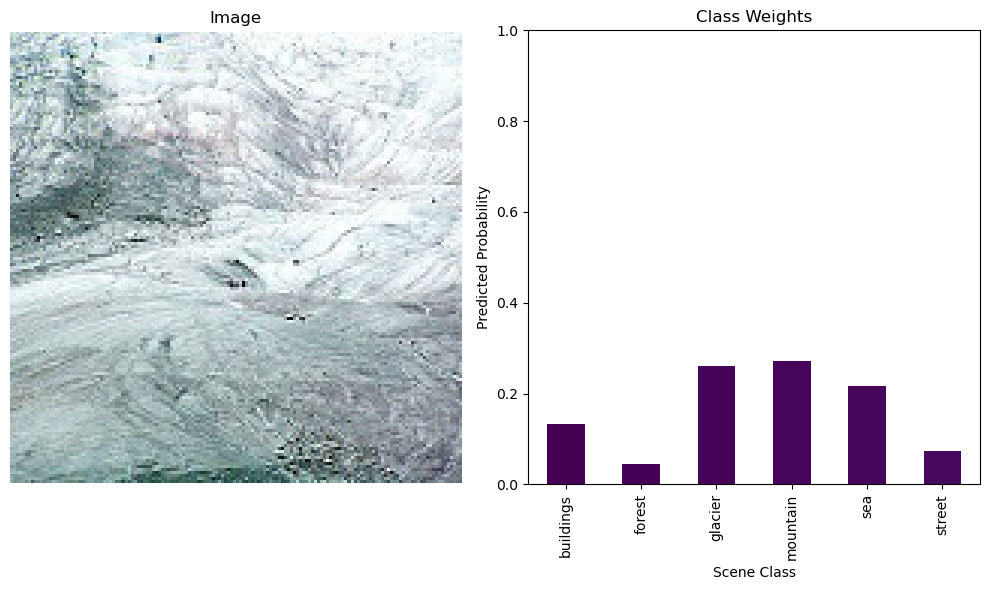

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


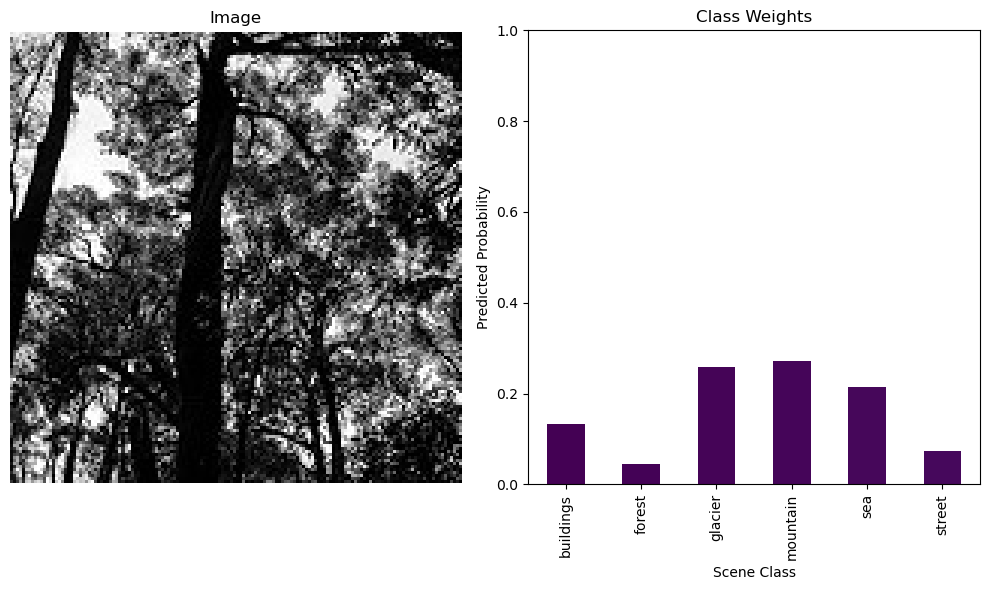

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


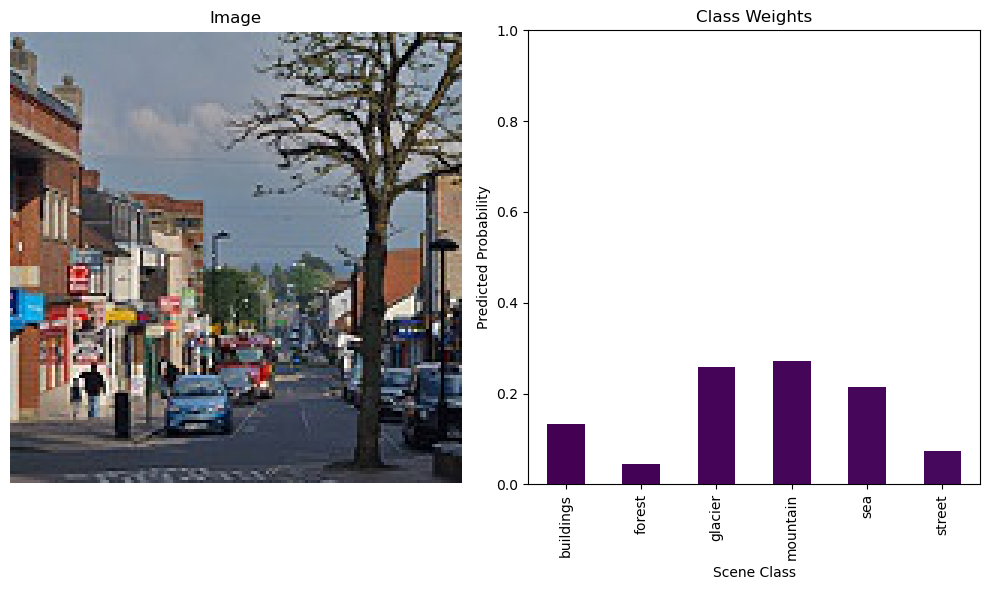

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


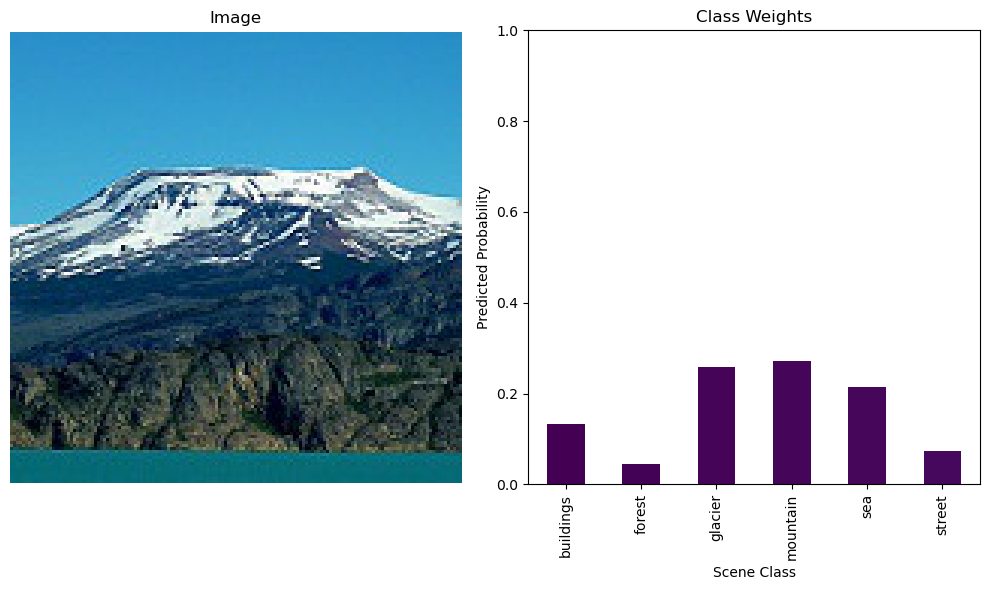

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

# Define class names and directory paths
classes = {"buildings": 0, "forest": 1, "glacier": 2, "mountain": 3, "sea": 4, "street": 5}
dir_pred = "D:/Downloads/CNN/seg_pred/seg_pred"

# Import the trained model
model = tf.keras.models.load_model("D:/Downloads/CNN/your_model1.keras")

# Randomly select 5 images from the prediction directory
import random
fnames_pred = os.listdir(dir_pred)
random.shuffle(fnames_pred)
selected_images = fnames_pred[:5]

# Function to predict and plot class weights for an image
def predict_and_plot_weights(image_path):
  # Read the image
  img = tf.keras.preprocessing.image.load_img(image_path, target_size=(150, 150))
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_array = tf.expand_dims(img_array, axis=0) / 255.0

  # Get prediction and class weights
  prediction = model.predict(img_array)[0]
  class_weights = pd.Series(prediction, index=classes.keys())

  # Plot image and bar chart
  plt.figure(figsize=(10, 6))
  plt.subplot(121)
  plt.imshow(img)
  plt.axis('off')
  plt.title("Image")

  plt.subplot(122)
  class_weights.plot(kind="bar", color=plt.cm.viridis.colors)
  plt.xlabel("Scene Class")
  plt.ylabel("Predicted Probability")
  plt.ylim(0, 1)
  plt.title("Class Weights")

  plt.tight_layout()
  plt.show()

# Predict and plot for each selected image
for image_path in selected_images:
  predict_and_plot_weights(os.path.join(dir_pred, image_path))

